In [34]:
import tensorflow.keras.layers as tkl
import matplotlib.pyplot as plt

from tensorflow import function
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Conv2DTranspose
from tensorflow.keras.optimizers import SGD, Adam
from tensorflow.keras.datasets import mnist
from tensorflow import data, ones_like, zeros_like, random, GradientTape
from tensorflow.keras import losses
%matplotlib inline

In [35]:
# 定义生成器
def generator_model():
    model = Sequential()
    model.add(tkl.Dense(256, input_shape=(100, ), use_bias=False))
    model.add(tkl.BatchNormalization())
    model.add(tkl.LeakyReLU())

    model.add(tkl.Dense(512, use_bias=False))
    model.add(tkl.BatchNormalization())
    model.add(tkl.LeakyReLU())

    model.add(tkl.Dense(28*28*1, use_bias=False, activation="tanh"))
    model.add(tkl.BatchNormalization())

    model.add(tkl.Reshape((28, 28, 1)))

    return model

# 定义判决器
class Inception_M(tkl.Layer):
    def __init__(self):
        super(Inception_M, self).__init__()
        self.con1_1 = Conv2D(filters=32, kernel_size=(3, 3), strides=2, padding="same")
        self.con2_1 = Conv2D(filters=16, kernel_size=(1, 1), strides=1, padding="same")
        self.con2_2 = Conv2D(filters=32, kernel_size=(5, 5), strides=2, padding="same")
        self.con3_1 = Conv2D(filters=8, kernel_size=(1, 1), strides=1, padding="same")
        self.con3_2 = Conv2D(filters=16, kernel_size=(3, 1), strides=1, padding="same")
        self.con3_3 = Conv2D(filters=32, kernel_size=(1, 3), strides=2, padding="same")
        self.ac = tkl.ReLU()
        self.a_pool = MaxPooling2D(pool_size=(3, 3), padding="same")

    def call(self, inputs, *args, **kwargs):
        output1 = self.con1_1(inputs)

        output2 = self.con2_1(inputs)
        output2 = self.con2_2(output2)

        output3 = self.con3_1(inputs)
        output3 = self.con3_2(output3)
        output3 = self.con3_3(output3)

        output = tkl.concatenate([output1, output2, output3])
        output = self.ac(output)
        output = self.a_pool(output)
        return output


class Discriminator_Model(Model):
    def call(self, inputs, training=None, mask=None):
        output = self.inception_m(inputs)
        output = self.flatten(output)
        output = self.fc1(output)
        output = self.ac1(output)
        output = self.bn(output)
        output = self.fc2(output)
        return output

    def get_config(self):
        super(Discriminator_Model, self).get_config()

    def __init__(self):
        super(Discriminator_Model, self).__init__()
        self.inception_m = Sequential([Inception_M()])
        self.flatten = tkl.Flatten()
        self.fc1 = tkl.Dense(512)
        self.ac1 = tkl.ReLU()
        self.bn = tkl.BatchNormalization()
        self.fc2 = tkl.Dense(1)

def discriminator_model():
    model = Sequential()
    model.add(tkl.Flatten())

    model.add(tkl.Dense(512, use_bias=False))
    model.add(tkl.BatchNormalization())
    model.add(tkl.LeakyReLU())

    model.add(tkl.Dense(256, use_bias=False))
    model.add(tkl.BatchNormalization())
    model.add(tkl.LeakyReLU())

    model.add(tkl.Dense(1))
    return model

In [36]:

g_model = generator_model()

d_model = discriminator_model()
d_model.build(input_shape=(None, 28, 28, 1))
g_model.summary()
d_model.summary()

Model: "sequential_20"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_44 (Dense)             (None, 256)               25600     
_________________________________________________________________
batch_normalization_32 (Batc (None, 256)               1024      
_________________________________________________________________
leaky_re_lu_16 (LeakyReLU)   (None, 256)               0         
_________________________________________________________________
dense_45 (Dense)             (None, 512)               131072    
_________________________________________________________________
batch_normalization_33 (Batc (None, 512)               2048      
_________________________________________________________________
leaky_re_lu_17 (LeakyReLU)   (None, 512)               0         
_________________________________________________________________
dense_46 (Dense)             (None, 784)             

In [37]:
(train_images, train_labels), (_, _) =mnist.load_data()
train_images = train_images.reshape(train_images.shape[0], 28, 28, 1).astype('float32')
train_images = (train_images - 127.5) / 127.5

datasets = data.Dataset.from_tensor_slices(train_images)
datasets = datasets.shuffle(10000).batch(128)

cross_entropy = losses.BinaryCrossentropy(from_logits=True)

def discriminator_loss(real_out, fake_out):
    real_loss = cross_entropy(ones_like(real_out), real_out)
    fake_loss = cross_entropy(zeros_like(fake_out), fake_out)
    return real_loss + fake_loss

def generator_loss(fake_out):
    return cross_entropy(ones_like(fake_out), fake_out)

In [38]:
generator_opt = Adam(1e-4) # SGD(learning_rate=0.01)
discriminator_opt = Adam(1e-4) # SGD(learning_rate=0.01)

noise_dim = 100  # 即用100个随机数生成图片

@function
def train_step(images):
    noise = random.normal([128, noise_dim])

    with GradientTape() as gen_tape, GradientTape() as disc_tape:
        real_out = d_model(images)

        gen_image = g_model(noise)
        fake_out = d_model(gen_image)

        gen_loss = generator_loss(fake_out)
        disc_loss = discriminator_loss(real_out, fake_out)
    gradient_gen = gen_tape.gradient(gen_loss, g_model.trainable_variables)
    gradient_disc = disc_tape.gradient(disc_loss, d_model.trainable_variables)
    generator_opt.apply_gradients(zip(gradient_gen, g_model.trainable_variables))
    discriminator_opt.apply_gradients(zip(gradient_disc, d_model.trainable_variables))
    return gen_loss, disc_loss

0--gen_loss:3.257025718688965--d_loss:0.098551288247108463

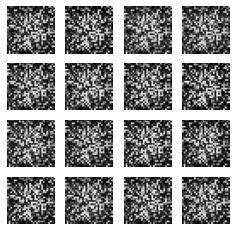


1--gen_loss:4.50517463684082--d_loss:0.05030356720089912444

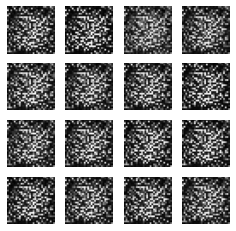


2--gen_loss:3.5327296257019043--d_loss:0.219337955117225656

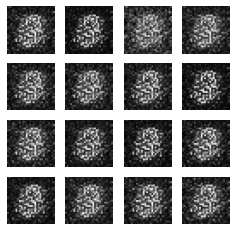


3--gen_loss:2.7625808715820312--d_loss:0.16321673989295965

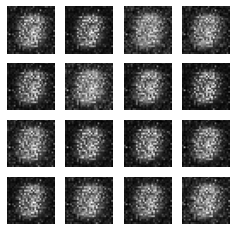


4--gen_loss:2.271183490753174--d_loss:0.316706776618957507

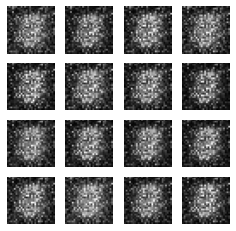


5--gen_loss:1.6449798345565796--d_loss:0.50457751750946044

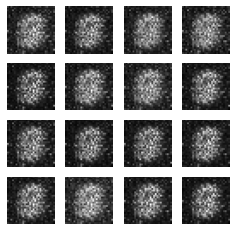


6--gen_loss:3.643739700317383--d_loss:0.142615139484405528

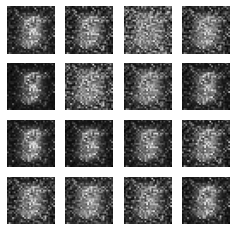


7--gen_loss:3.1681649684906006--d_loss:0.14837539196014404

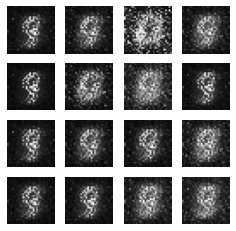


8--gen_loss:3.782705783843994--d_loss:0.094182446599006654

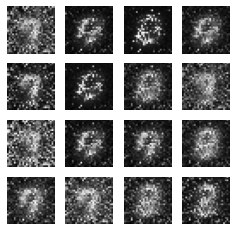


9--gen_loss:3.531230926513672--d_loss:0.099101565778255463

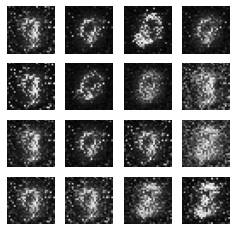


10--gen_loss:4.324787139892578--d_loss:0.207939535379409862

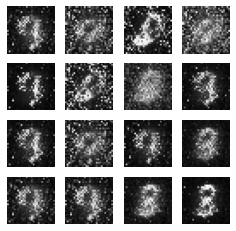


11--gen_loss:3.9831511974334717--d_loss:0.19677041471004486

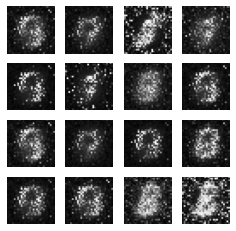


12--gen_loss:5.333105087280273--d_loss:0.283578872680664062

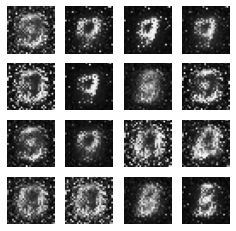


13--gen_loss:3.7604384422302246--d_loss:0.16610753536224365

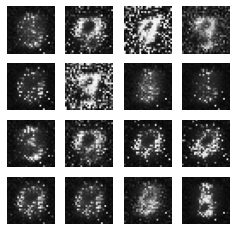


14--gen_loss:5.447761535644531--d_loss:0.321798503398895266

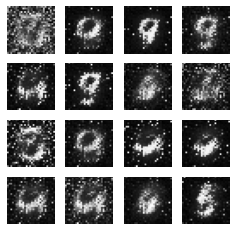


15--gen_loss:5.3001837730407715--d_loss:0.45742535591125497

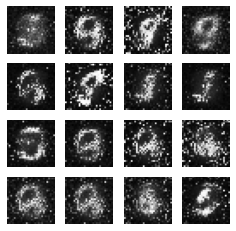


16--gen_loss:4.0862932205200195--d_loss:0.21007715165615082

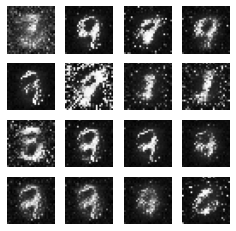


17--gen_loss:3.1517350673675537--d_loss:0.36551916599273683

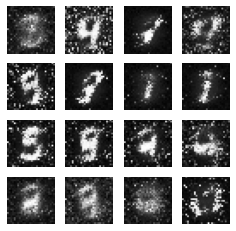


18--gen_loss:3.4257214069366455--d_loss:0.35325610637664795

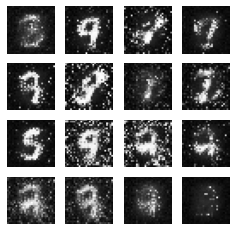


19--gen_loss:3.2564990520477295--d_loss:0.24475190043449402

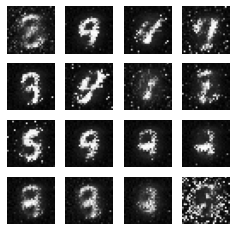


20--gen_loss:4.2020955085754395--d_loss:0.34479519724845886

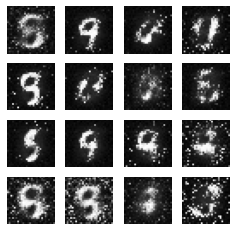


21--gen_loss:3.1227834224700928--d_loss:0.26359513401985175

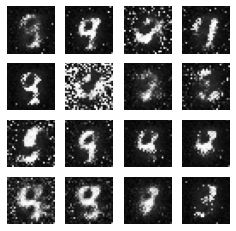


22--gen_loss:3.867978096008301--d_loss:0.301447570323944136

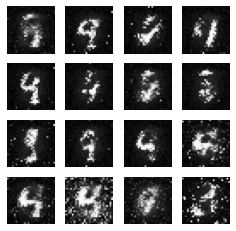


23--gen_loss:3.8120791912078857--d_loss:0.34778141975402837

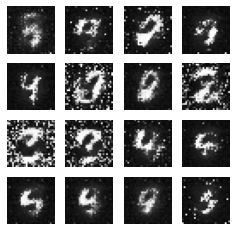


24--gen_loss:4.414223670959473--d_loss:0.235136747360229585

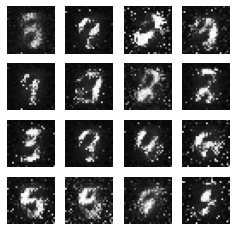


25--gen_loss:3.1966848373413086--d_loss:0.37319898605346686

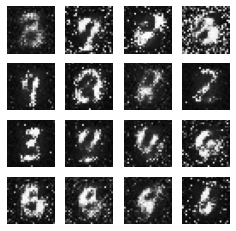


26--gen_loss:3.6562700271606445--d_loss:0.36978912353515625

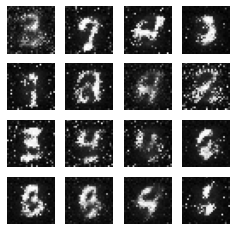


27--gen_loss:3.958949565887451--d_loss:0.284524142742157467

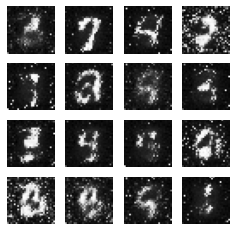


28--gen_loss:2.7733101844787598--d_loss:0.38093322515487673

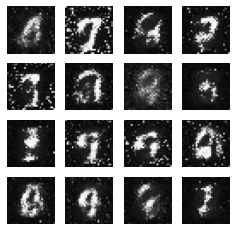


29--gen_loss:3.352654457092285--d_loss:0.409588605165481577

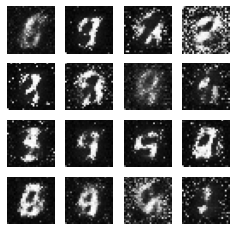


30--gen_loss:2.8788676261901855--d_loss:0.37100392580032355

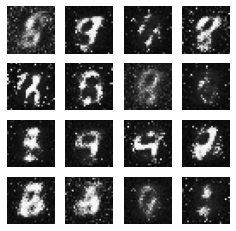


31--gen_loss:2.592952013015747--d_loss:0.399203300476074274

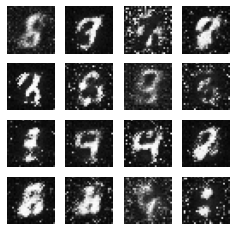


32--gen_loss:2.18863582611084--d_loss:0.5170935988426208963

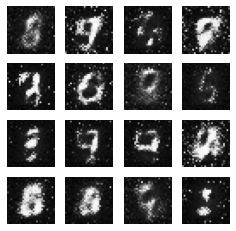


33--gen_loss:3.3139305114746094--d_loss:0.61627745628356933

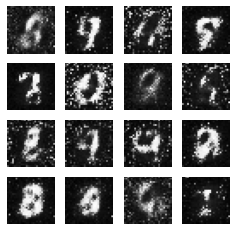


34--gen_loss:2.8389062881469727--d_loss:0.39977878332138067

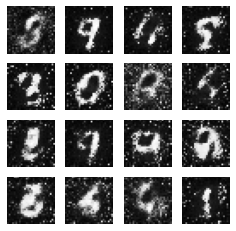


35--gen_loss:2.8597474098205566--d_loss:0.72255039215087895

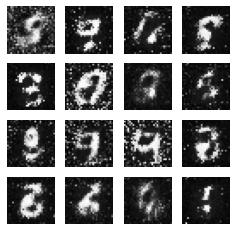


36--gen_loss:2.6003851890563965--d_loss:0.59653031826019297

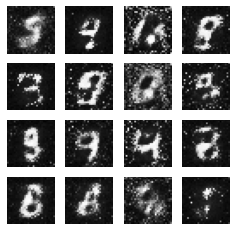


37--gen_loss:4.3620500564575195--d_loss:0.48512744903564453

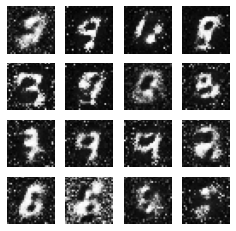


38--gen_loss:3.068683624267578--d_loss:0.525561690330505463

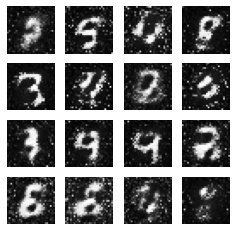


39--gen_loss:2.73687481880188--d_loss:0.5250704288482666456

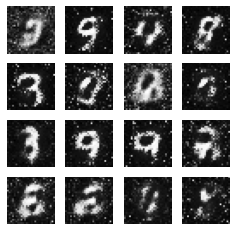


40--gen_loss:3.016920804977417--d_loss:0.575626075267791784

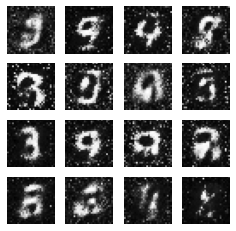


41--gen_loss:2.6881895065307617--d_loss:0.65168052911758424

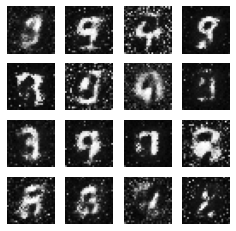


42--gen_loss:2.535410165786743--d_loss:0.652683019638061586

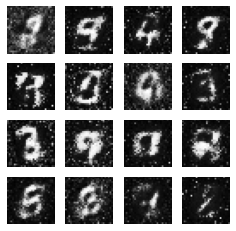


43--gen_loss:2.1927566528320312--d_loss:0.78619146347045917

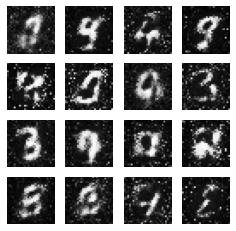


44--gen_loss:3.090742349624634--d_loss:0.579467535018920993

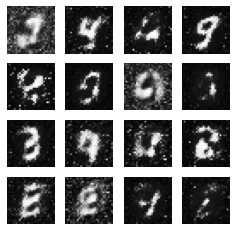


45--gen_loss:2.228428840637207--d_loss:0.546088218688964835

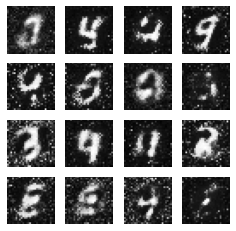


46--gen_loss:1.5523325204849243--d_loss:0.71536082029342654

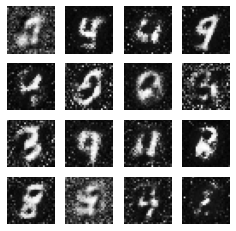


47--gen_loss:2.240842342376709--d_loss:0.699121832847595234

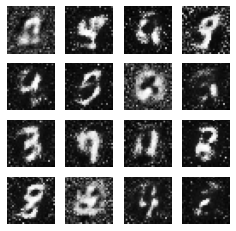


48--gen_loss:2.3845741748809814--d_loss:0.5808180570602417

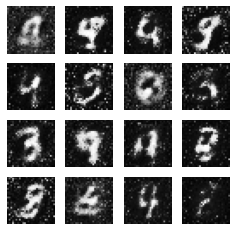


49--gen_loss:2.5644452571868896--d_loss:0.65039479732513434

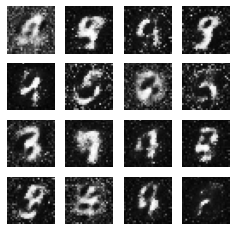


50--gen_loss:2.2050719261169434--d_loss:0.51122337579727176

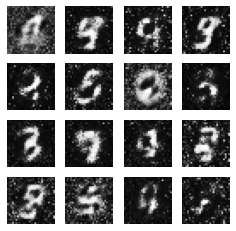


51--gen_loss:3.013777494430542--d_loss:0.681620180606842634

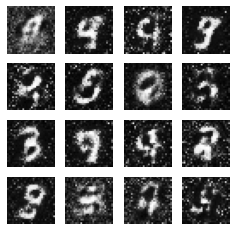


52--gen_loss:2.4148387908935547--d_loss:0.67802822589874276

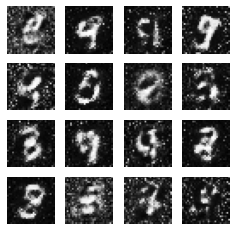


53--gen_loss:2.4362874031066895--d_loss:0.57409036159515383

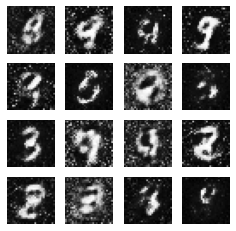


54--gen_loss:1.7188899517059326--d_loss:0.68332350254058847

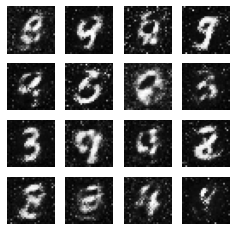


55--gen_loss:2.3235106468200684--d_loss:0.75041073560714723

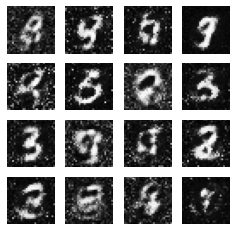


56--gen_loss:1.8683841228485107--d_loss:0.7016880512237549

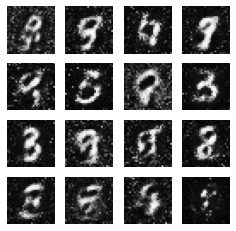


57--gen_loss:1.7288326025009155--d_loss:0.7702184915542603

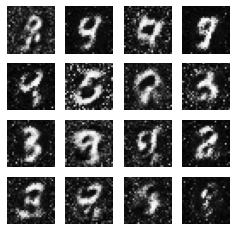


58--gen_loss:2.06361722946167--d_loss:0.6937978863716125277

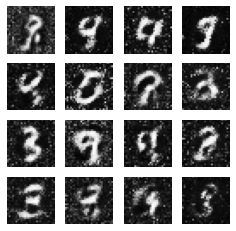


59--gen_loss:2.2253048419952393--d_loss:0.74073803424835287

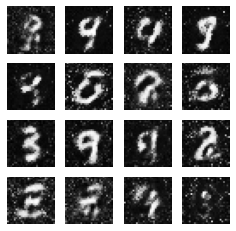


60--gen_loss:2.409013271331787--d_loss:0.760863542556762735

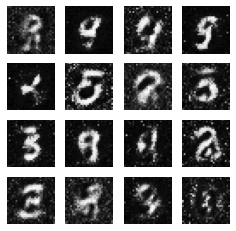


61--gen_loss:1.498735785484314--d_loss:0.95737171173095793

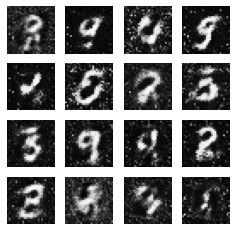


62--gen_loss:2.111903667449951--d_loss:0.67913579940795987

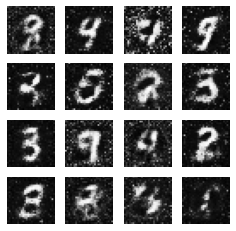


63--gen_loss:2.066124439239502--d_loss:0.762010395526886175

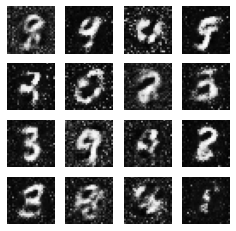


64--gen_loss:2.1615004539489746--d_loss:0.6336350440979004

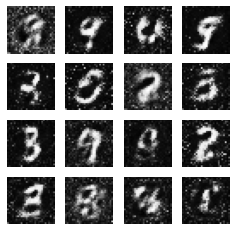


65--gen_loss:1.9518219232559204--d_loss:0.9433614611625671

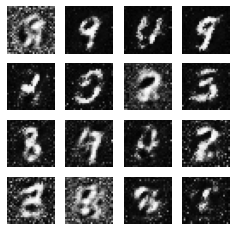


66--gen_loss:1.7062137126922607--d_loss:0.77088665962219243

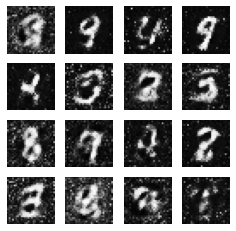


67--gen_loss:2.2084672451019287--d_loss:0.86203861236572277

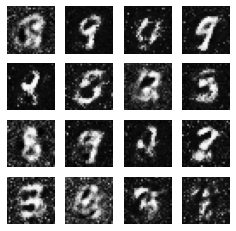


68--gen_loss:1.9497753381729126--d_loss:0.8646646738052368

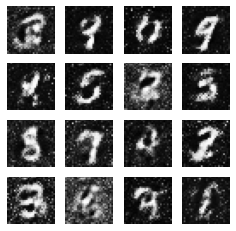


69--gen_loss:2.4609856605529785--d_loss:0.6527385711669922

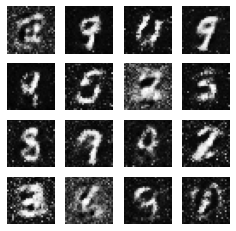


70--gen_loss:2.0545921325683594--d_loss:0.7780797481536865

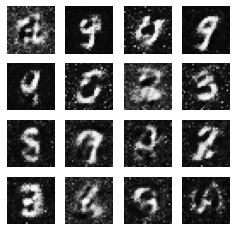


71--gen_loss:2.029771327972412--d_loss:0.73664027452468873

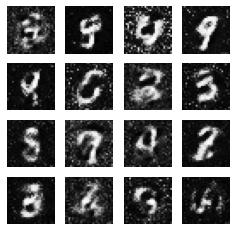


72--gen_loss:2.6056113243103027--d_loss:0.9735932350158691

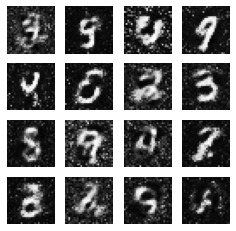


73--gen_loss:2.181440591812134--d_loss:0.76939368247985844

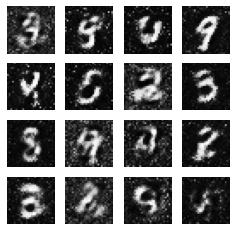


74--gen_loss:1.6387712955474854--d_loss:0.8063731193542485

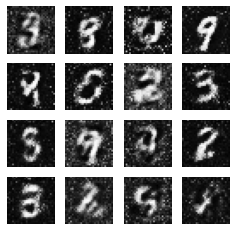


75--gen_loss:1.8282885551452637--d_loss:0.79935264587402344

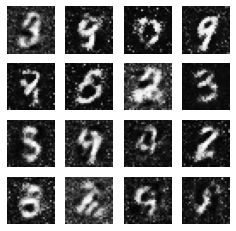


76--gen_loss:1.6702027320861816--d_loss:0.7526377439498901

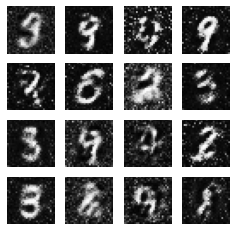


77--gen_loss:1.914804220199585--d_loss:0.69786250591278083

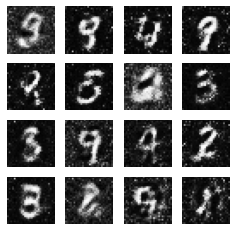


78--gen_loss:1.9398386478424072--d_loss:0.8931759595870972

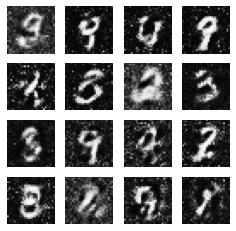


79--gen_loss:1.9382002353668213--d_loss:0.8190565705299377

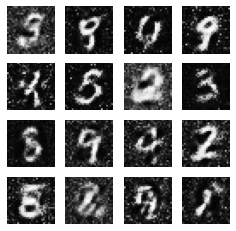


80--gen_loss:2.245162010192871--d_loss:0.78267991542816167

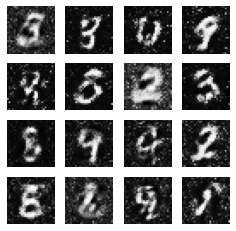


81--gen_loss:2.282620429992676--d_loss:0.82351577281951955

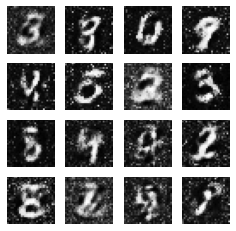


82--gen_loss:1.6532933712005615--d_loss:0.9875140190124512

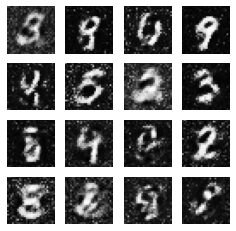


83--gen_loss:1.9100931882858276--d_loss:0.8221797943115234

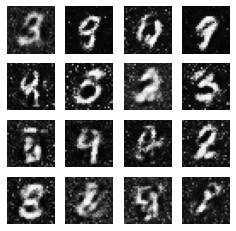


84--gen_loss:2.103515148162842--d_loss:1.15840291976928722

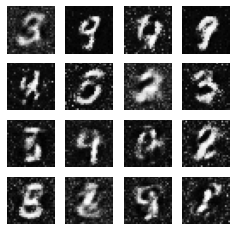


85--gen_loss:2.064544677734375--d_loss:0.82203942537307747

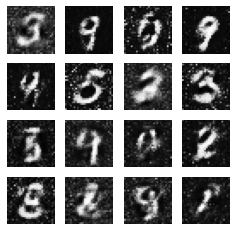


86--gen_loss:2.4629781246185303--d_loss:0.9088770151138306

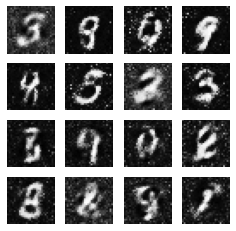


87--gen_loss:2.238595724105835--d_loss:0.87687540054321294

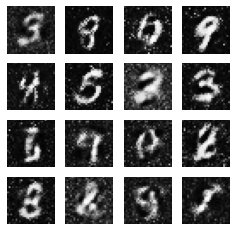


88--gen_loss:1.797062635421753--d_loss:0.73108631372451781

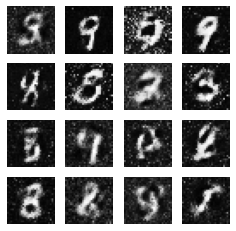


89--gen_loss:2.514429807662964--d_loss:0.81542551517486575

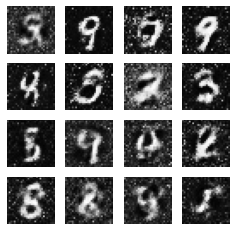


90--gen_loss:2.223907470703125--d_loss:0.72318470478057868

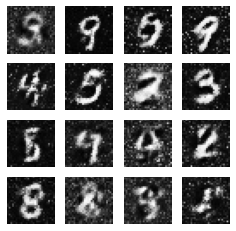


91--gen_loss:1.9858050346374512--d_loss:0.7695142626762397

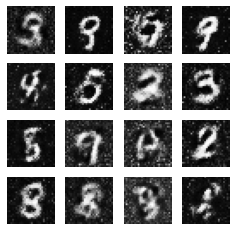


92--gen_loss:1.4630835056304932--d_loss:0.8375614285469055

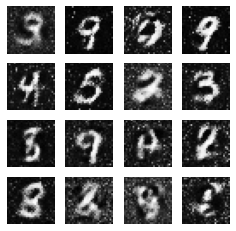


93--gen_loss:2.1232481002807617--d_loss:0.61318671703338625

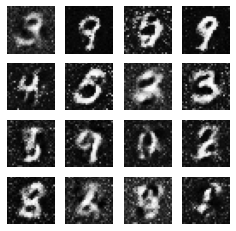


94--gen_loss:2.3991079330444336--d_loss:0.6234248876571655

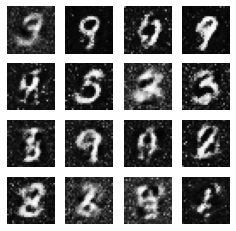


95--gen_loss:2.2357850074768066--d_loss:0.6332554817199707

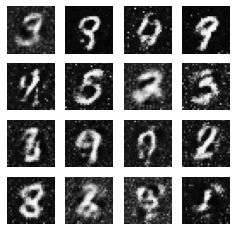


96--gen_loss:2.0029067993164062--d_loss:0.6875357627868652

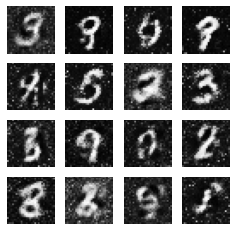


97--gen_loss:2.141672372817993--d_loss:0.68581199645996092

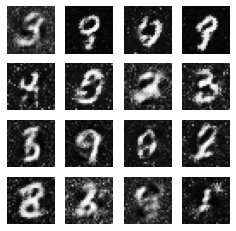


98--gen_loss:1.8127062320709229--d_loss:0.6551479697227478

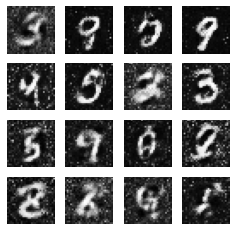


99--gen_loss:2.4576923847198486--d_loss:0.73779296875885013

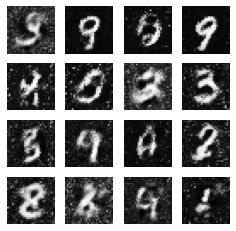


100--gen_loss:1.913996696472168--d_loss:0.84059733152389531

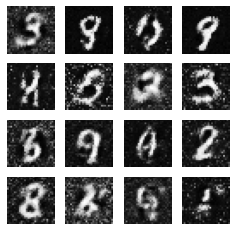


101--gen_loss:1.8882911205291748--d_loss:1.0137767791748047

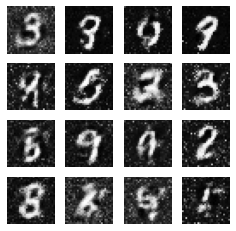


102--gen_loss:1.593268871307373--d_loss:0.87201321125030523

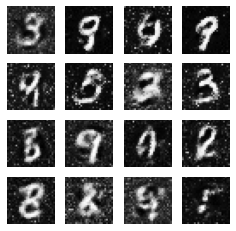


103--gen_loss:2.039698600769043--d_loss:0.69614064693450939

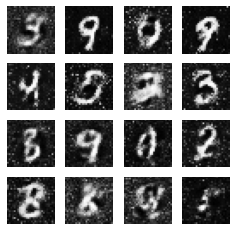


104--gen_loss:2.5471596717834473--d_loss:0.77236288785934457

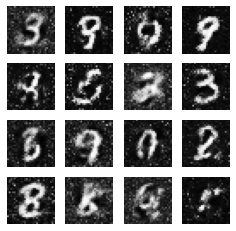


105--gen_loss:2.280860424041748--d_loss:0.654595375061035294

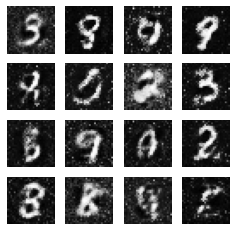


106--gen_loss:1.6017762422561646--d_loss:0.7060539126396179

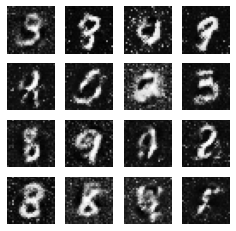


107--gen_loss:2.12134051322937--d_loss:0.8823704719543457453

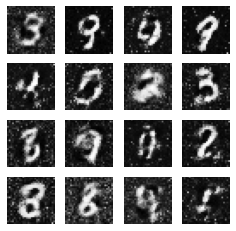


108--gen_loss:1.966491937637329--d_loss:0.64046800136566167

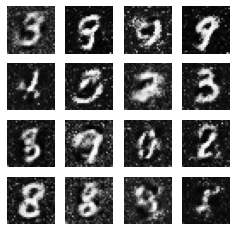


109--gen_loss:2.068585157394409--d_loss:0.75870549678802498

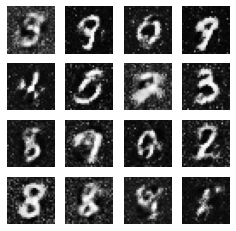


110--gen_loss:2.066032886505127--d_loss:0.77975213527679449

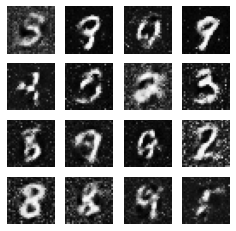


111--gen_loss:2.4490160942077637--d_loss:0.89657348394393924

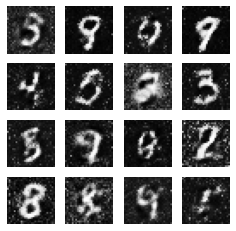


112--gen_loss:2.037895441055298--d_loss:0.71582716703414923

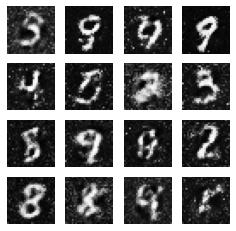


113--gen_loss:1.783942699432373--d_loss:0.72470319271087656

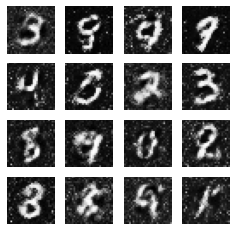


114--gen_loss:2.015484571456909--d_loss:0.83326256275177075

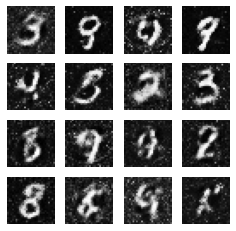


115--gen_loss:1.6466412544250488--d_loss:0.8661373257637024

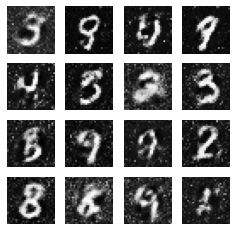


116--gen_loss:1.6946954727172852--d_loss:0.6081346869468689

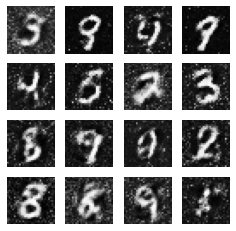


117--gen_loss:2.0220751762390137--d_loss:0.5823466181755066

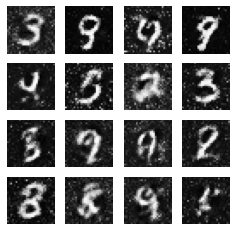


118--gen_loss:1.9048311710357666--d_loss:0.6973662376403809

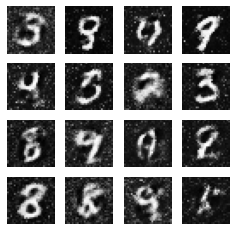


119--gen_loss:2.1583986282348633--d_loss:0.76234853267669685

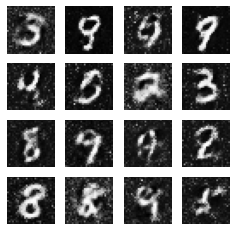


120--gen_loss:1.8789901733398438--d_loss:0.6905373334884644

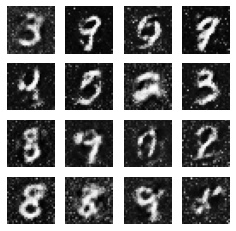


121--gen_loss:1.89667546749115--d_loss:0.729540228843689895

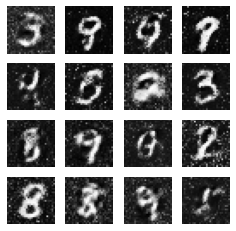


122--gen_loss:1.8007267713546753--d_loss:0.7225592136383057

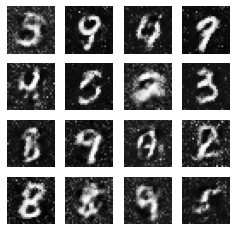


123--gen_loss:2.263282060623169--d_loss:0.67956864833831798

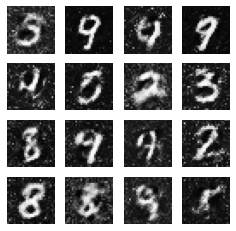


124--gen_loss:1.7694289684295654--d_loss:0.6252472996711731

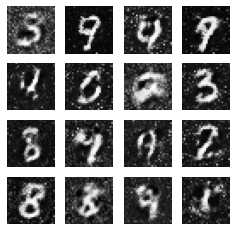


125--gen_loss:1.6858625411987305--d_loss:0.9092605113983154

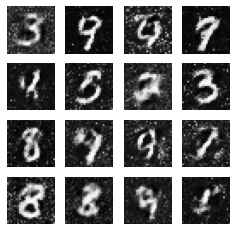


126--gen_loss:1.7420387268066406--d_loss:0.7289924025535583

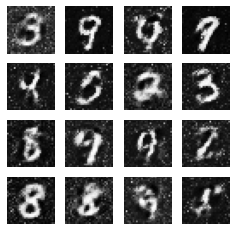


127--gen_loss:1.4620685577392578--d_loss:0.8675295710563668

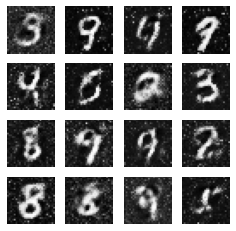


128--gen_loss:2.04361891746521--d_loss:0.778325676918029855

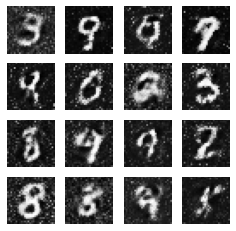


129--gen_loss:1.5211329460144043--d_loss:0.8413842916488647

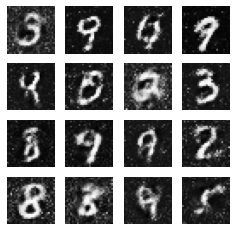


130--gen_loss:2.179840326309204--d_loss:0.58217144012451175

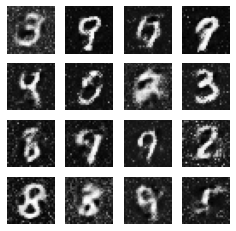


131--gen_loss:1.4397730827331543--d_loss:0.8309500813484192

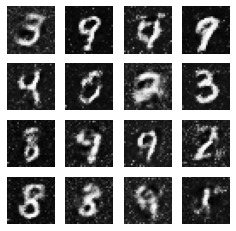


132--gen_loss:1.8765913248062134--d_loss:0.8536892533302307

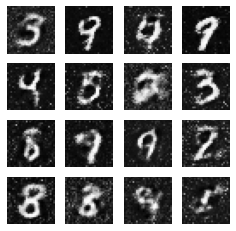


133--gen_loss:2.177868604660034--d_loss:0.82652634382247923

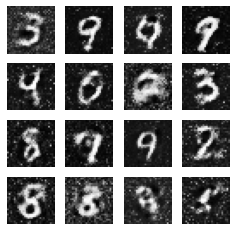


134--gen_loss:2.1034135818481445--d_loss:0.9562127590179443

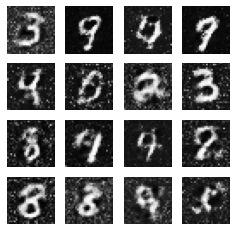


135--gen_loss:1.7956699132919312--d_loss:0.6685343980789185

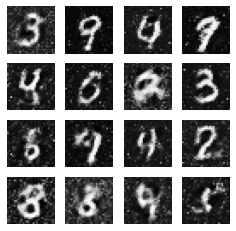


136--gen_loss:2.278820514678955--d_loss:0.63616371154785162

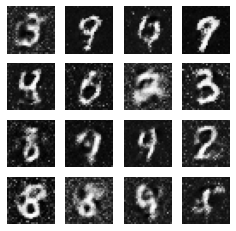


137--gen_loss:2.1466474533081055--d_loss:0.8216673135757446

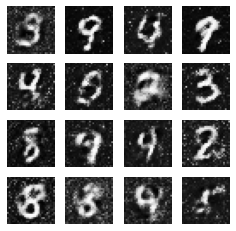


138--gen_loss:2.0480167865753174--d_loss:0.7317606210708618

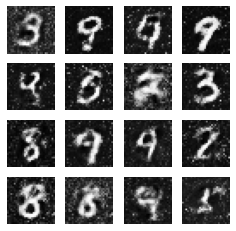


139--gen_loss:2.1229896545410156--d_loss:0.6490672826766968

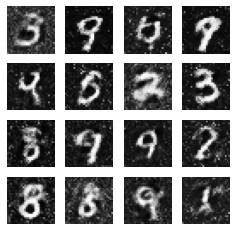


140--gen_loss:1.8389495611190796--d_loss:0.7019049525260925

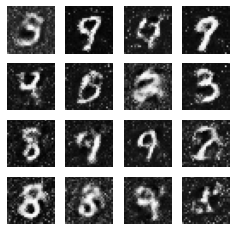


141--gen_loss:1.9858589172363281--d_loss:0.8145645856857375

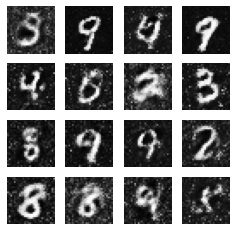


142--gen_loss:1.4035382270812988--d_loss:0.8476157188415527

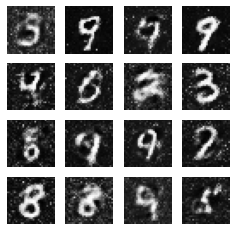


143--gen_loss:2.0792315006256104--d_loss:0.7887746691703796

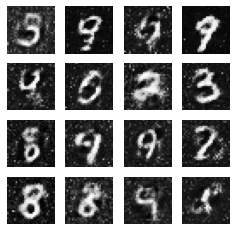


144--gen_loss:1.6304075717926025--d_loss:0.8605446219444275

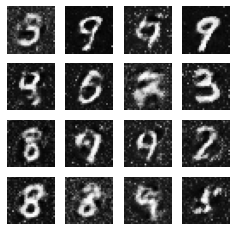


145--gen_loss:1.989497184753418--d_loss:0.67381238937377938

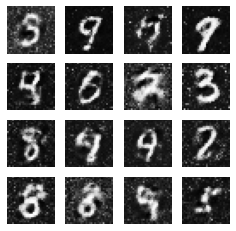


146--gen_loss:1.9478049278259277--d_loss:0.7312165498733525

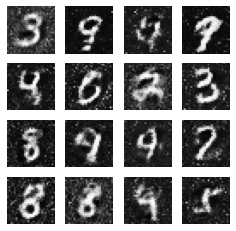


147--gen_loss:2.370417833328247--d_loss:0.56761288642883393

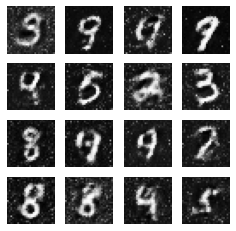


148--gen_loss:1.4158062934875488--d_loss:0.9566376209259033

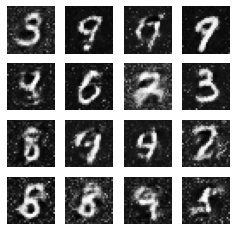


149--gen_loss:1.5347859859466553--d_loss:0.8484982848167419

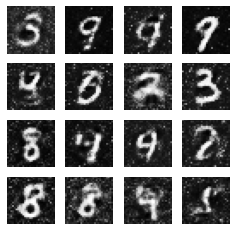


150--gen_loss:1.7244439125061035--d_loss:0.8122999668121338

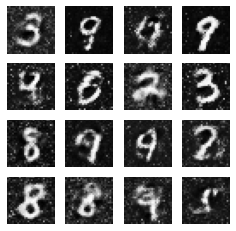


151--gen_loss:2.0436129570007324--d_loss:0.7597335577011108

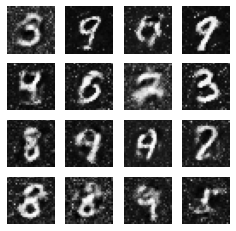


152--gen_loss:2.4450464248657227--d_loss:0.8003410100936895

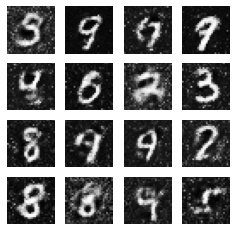


153--gen_loss:1.8035337924957275--d_loss:0.7693215012550354

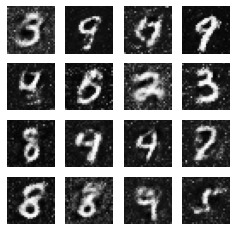


154--gen_loss:1.6616116762161255--d_loss:0.8051513433456421

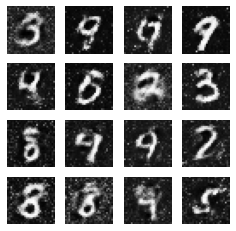


155--gen_loss:1.662416696548462--d_loss:0.76361751556396487

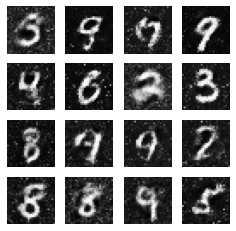


156--gen_loss:1.8881727457046509--d_loss:0.6966278553009033

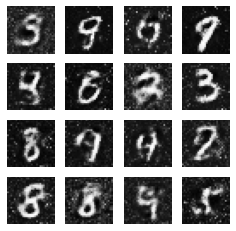


157--gen_loss:1.3411688804626465--d_loss:0.8939392566680908

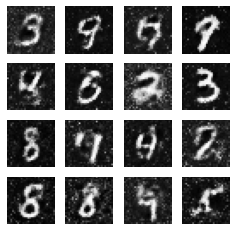


158--gen_loss:2.2026124000549316--d_loss:0.8107252120971686

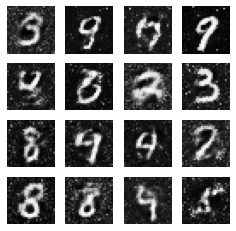


159--gen_loss:1.4719882011413574--d_loss:0.9743218421936035

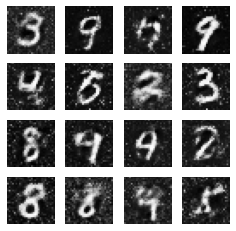


160--gen_loss:2.209240198135376--d_loss:0.76417803764343266

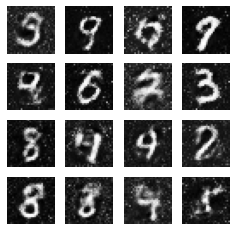


161--gen_loss:2.140714645385742--d_loss:0.71071779727935798

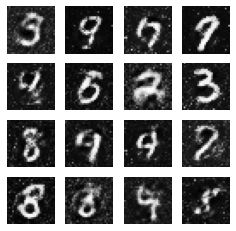


162--gen_loss:1.780761957168579--d_loss:0.86020082235336386

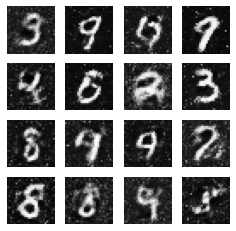


163--gen_loss:1.649137020111084--d_loss:0.75976806879043583

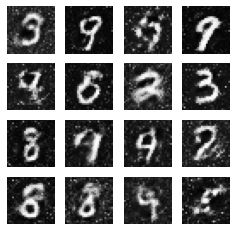


164--gen_loss:1.9097362756729126--d_loss:0.8031046390533447

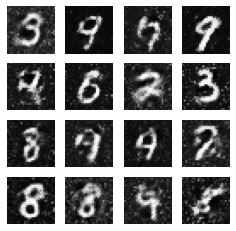


165--gen_loss:1.6998045444488525--d_loss:0.8114986419677734

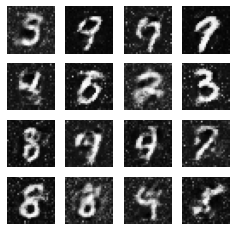


166--gen_loss:1.7765920162200928--d_loss:0.7764489650726318

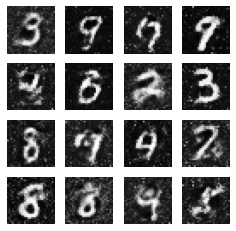


167--gen_loss:2.2044262886047363--d_loss:0.7604436874389648

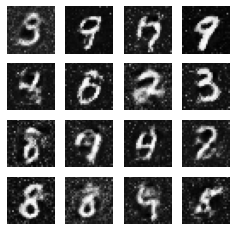


168--gen_loss:2.2996983528137207--d_loss:0.7082128524780273

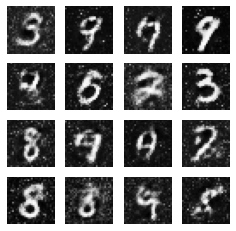


169--gen_loss:2.1267871856689453--d_loss:0.7937941551208496

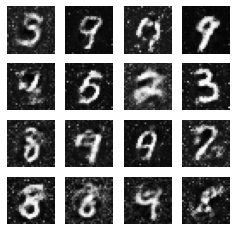


170--gen_loss:2.2545251846313477--d_loss:0.9473729133605957

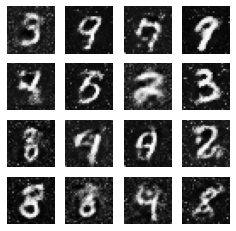


171--gen_loss:1.4729127883911133--d_loss:0.8603363037109375

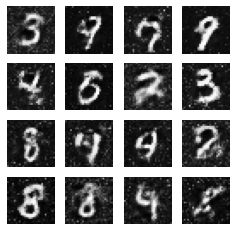


172--gen_loss:1.7745044231414795--d_loss:0.7520726919174194

KeyboardInterrupt: 

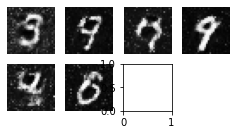

In [39]:
def generate_plot_image(gen_model, test_noise):
    pre_images = gen_model(test_noise)
    _ = plt.figure(figsize=(4, 4))
    for i in range(pre_images.shape[0]):
        plt.subplot(4, 4, i+1)
        plt.imshow((pre_images[i, :, :, 0] + 1)/2, cmap='gray')
        plt.axis('off')
    plt.show()


EPOCHS = 1000  # 训练100次
num_exp_to_generate = 16  # 生成16张图片
seed = random.normal([num_exp_to_generate, noise_dim])  # 16组随机数组，每组含100个随机数，用来生成16张图片。


def train(dataset, epochs):
    for epoch in range(epochs):
        for image_batch in dataset:
            gen_loss, d_loss = train_step(image_batch)
            print(f'\r{epoch}--gen_loss:{gen_loss.numpy()}--d_loss:{d_loss.numpy()}', end='', flush=True)
        generate_plot_image(g_model, seed)
        print()

train(datasets, EPOCHS)